In [0]:
%run ./SteamProject

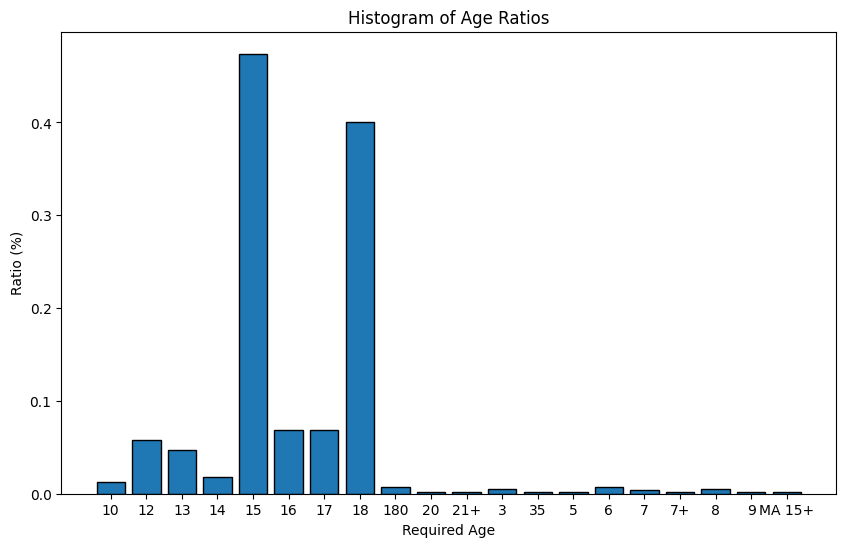

In [0]:
age_counts = data.groupBy('required_age').count()

total_count = data.count()

age_ratio_df = age_counts.withColumn('ratio', age_counts['count'] * 100 / total_count)

age_ratio_filtered = age_ratio_df.filter(age_ratio_df['required_age'] != '0').orderBy('required_age').toPandas()

plt.figure(figsize=(10, 6))
plt.bar(age_ratio_filtered['required_age'], age_ratio_filtered['ratio'], edgecolor='k')
plt.xlabel('Required Age')
plt.ylabel('Ratio (%)')
plt.title('Histogram of Age Ratios')
plt.show()

### Les jeux possédants une limite d'age sont extrêment minotaires. C'est assez surprenant, peut être que les éditeurs ne sont pas obliger par steam à mettre un âge requis/conseiller.

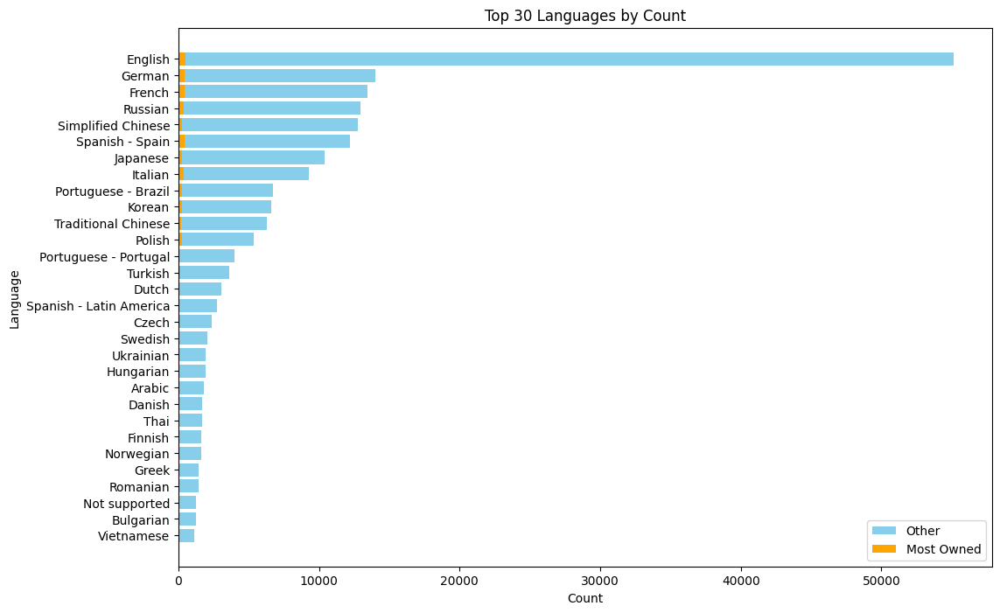

In [0]:
data_languages_exploded = data.withColumn('language', explode(split(data['languages'], ', ')))
most_owned_languages_exploded = most_owned.withColumn('language', explode(split(most_owned['languages'], ', ')))

data_language_counts = data_languages_exploded.groupBy('language').count().withColumnRenamed('count', 'data_count')
most_owned_language_counts = most_owned_languages_exploded.groupBy('language').count().withColumnRenamed('count', 'most_owned_count')


language_counts_combined = data_language_counts.join(most_owned_language_counts, 'language', 'left').fillna(0)


top_30_languages = language_counts_combined.orderBy(col('data_count').desc()).limit(30)


top_30_languages_pd = top_30_languages.toPandas()

plt.figure(figsize=(12, 8))
plt.barh(top_30_languages_pd['language'], top_30_languages_pd['data_count'], color='skyblue', label='Other')
plt.barh(top_30_languages_pd['language'], top_30_languages_pd['most_owned_count'], color='orange', label='Most Owned')
plt.xlabel('Count')
plt.ylabel('Language')
plt.title('Top 30 Languages by Count')
plt.gca().invert_yaxis()
plt.legend()
plt.show()

In [0]:
from pyspark.sql.functions import col, size, split

total_rows = most_owned.count()
multiple_languages_rows = most_owned.filter(size(split(col('languages'), ', ')) > 1).count()

ratio_multiple_languages = (multiple_languages_rows / total_rows) * 100

ratio_multiple_languages

91.18236472945893

### 91% des jeux les plus possédés ont au moins 2 langues différentes proposées. Reste a savoir dans quel proportion la localisation s'est faite en amont ou aval du succès du jeu.


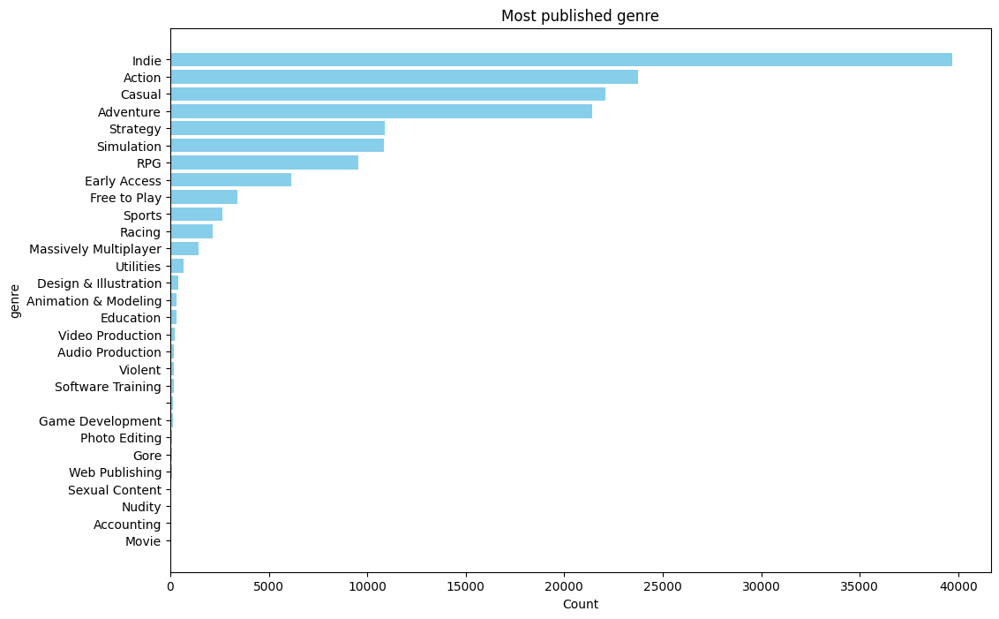

In [0]:
genre_exploded = data.withColumn('genres', explode(split(data['genre'], ', ')))

genre_counts = genre_exploded.groupBy('genres').count().orderBy('count', ascending=False).toPandas()

plt.figure(figsize=(12, 8))
plt.barh(genre_counts['genres'], genre_counts['count'], color='skyblue')
plt.xlabel('Count')
plt.ylabel('genre')
plt.title('Most published genre')
plt.gca().invert_yaxis()
plt.show()

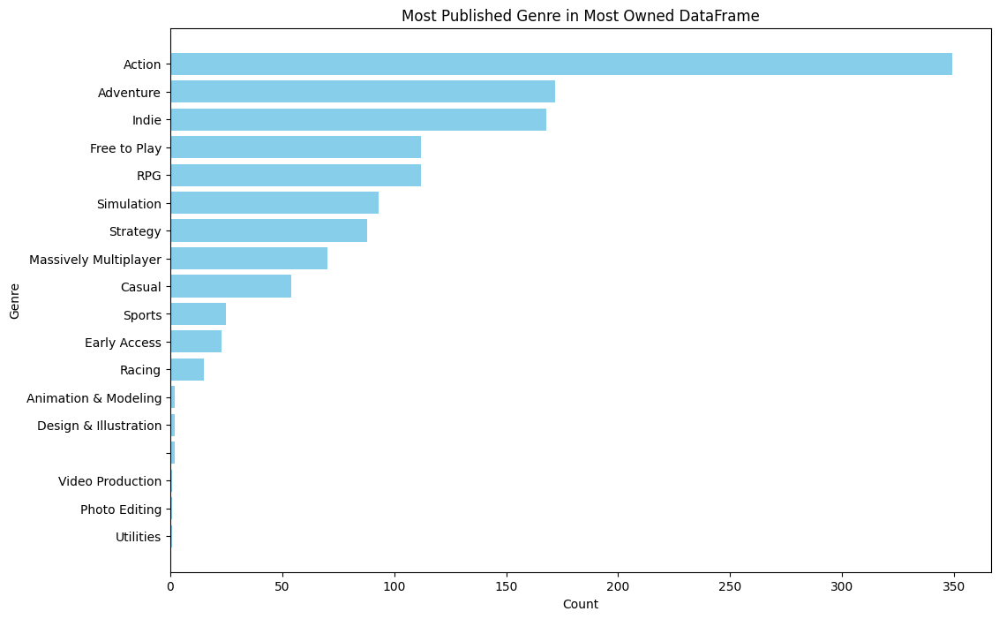

In [0]:
genre_exploded_most_owned = most_owned.withColumn('genres', explode(split(most_owned['genre'], ', ')))

genre_counts_most_owned = genre_exploded_most_owned.groupBy('genres').count().orderBy('count', ascending=False).toPandas()

plt.figure(figsize=(12, 8))
plt.barh(genre_counts_most_owned['genres'], genre_counts_most_owned['count'], color='skyblue')
plt.xlabel('Count')
plt.ylabel('Genre')
plt.title('Most Published Genre in Most Owned DataFrame')
plt.gca().invert_yaxis()
plt.show()

### Le genre indé est surrprésenté dans les jeux proposés sur steam par rapport a son attrait chez les joueurs. C'est surement du au nombre de petits développeurs qui travaillent seuls ou en petites équipes qui publient sur steam. 

In [0]:
top_publishers = data.groupBy('publisher').count().orderBy(desc('count')).limit(10)

top_publishers_data = data.join(top_publishers, on='publisher', how='inner')

top_publishers_genres = top_publishers_data.withColumn('genres', explode(split(col('genre'), ', ')))

publisher_genre_counts = top_publishers_genres.groupBy('publisher', 'genres').count()

window_spec = Window.partitionBy('publisher').orderBy(desc('count'))
most_represented_genre = publisher_genre_counts.withColumn('rank', rank().over(window_spec)).filter(col('rank') == 1).drop('rank')

display(most_represented_genre)

publisher,genres,count
,Indie,106
8floor,Casual,202
Big Fish Games,Casual,418
Choice of Games,RPG,139
HH-Games,Casual,132
SEGA,Action,80
Sekai Project,Casual,99
Square Enix,Action,75
Strategy First,Strategy,52
Ubisoft,Action,70


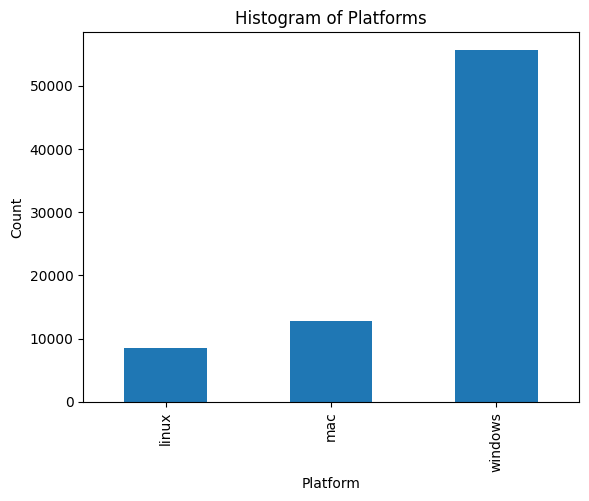

In [0]:
data_with_array = data.select(
    col("*"),
    expr("stack(3, 'linux', platforms.linux, 'mac', platforms.mac, 'windows', platforms.windows) as (platform, is_supported)")
)

platforms_exploded = data_with_array.select("id", "platform", "is_supported")

supported_platforms = platforms_exploded.filter(col("is_supported") == True)

platform_counts = supported_platforms.groupBy("platform").count().collect()

platform_counts_pd = pd.DataFrame(platform_counts, columns=["platform", "count"])

platform_counts_pd.plot(kind='bar', x='platform', y='count', legend=False)
plt.xlabel('Platform')
plt.ylabel('Count')
plt.title('Histogram of Platforms')
plt.show()

<Figure size 5000x4000 with 0 Axes>

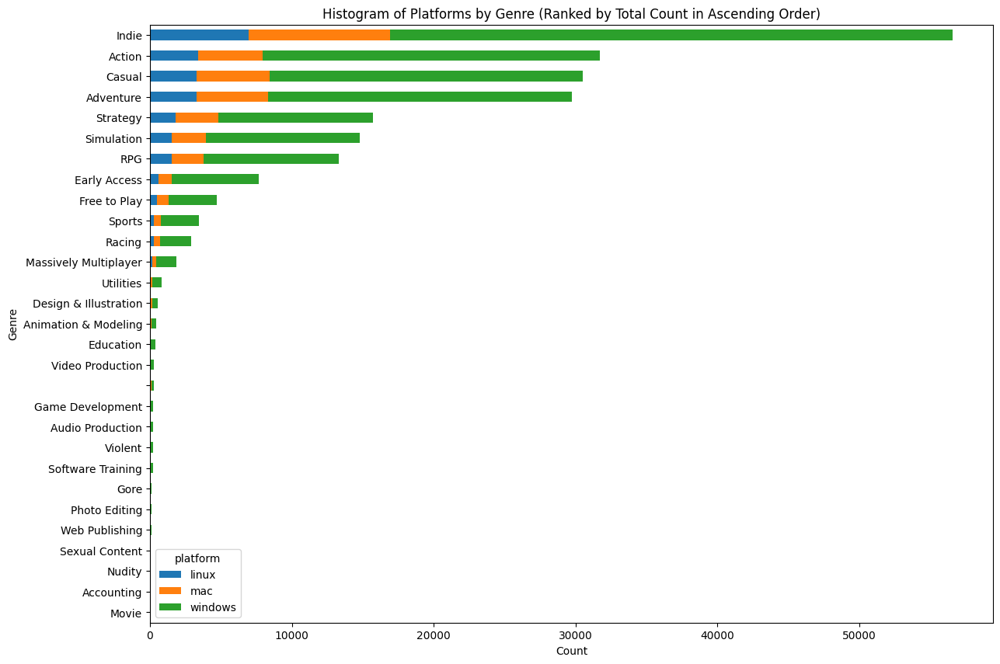

In [0]:
spark = SparkSession.builder.appName("GenrePlatformRanking").getOrCreate()

data_genres_exploded = data.withColumn('genres', explode(split(col('genre'), ', ')))

data_with_array_genres = data_genres_exploded.select(
    col("*"),
    expr("stack(3, 'linux', platforms.linux, 'mac', platforms.mac, 'windows', platforms.windows) as (platform, is_supported)")
)

platforms_exploded_genres = data_with_array_genres.select("id", "genres", "platform", "is_supported")

supported_platforms_genres = platforms_exploded_genres.filter(col("is_supported") == True)

platform_genre_counts = supported_platforms_genres.groupBy("genres", "platform").count()

total_genre_counts = platform_genre_counts.groupBy("genres") \
    .agg(spark_sum("count").alias("total_count"))

platform_genre_counts_sorted = platform_genre_counts.join(total_genre_counts, on="genres") \
    .orderBy(col("total_count").asc(), col("count").asc())


platform_genre_counts_pd = platform_genre_counts_sorted.toPandas()


platform_genre_counts_pivot = platform_genre_counts_pd.pivot(index='genres', columns='platform', values='count')
platform_genre_counts_pivot = platform_genre_counts_pivot.loc[platform_genre_counts_pd['genres'].unique()]


plt.figure(figsize=(50, 40))  
platform_genre_counts_pivot.plot(kind='barh', stacked=True, figsize=(14, 10))
plt.ylabel('Genre')
plt.xlabel('Count')
plt.title('Histogram of Platforms by Genre (Ranked by Total Count in Ascending Order)')
plt.show()

### Pas de genres qui soit plus représenté sur une plateform qu'un autre

In [0]:
from pyspark.sql.functions import concat_ws

data = data.withColumn("categories", concat_ws(",", col("categories")))

In [0]:
most_owned = most_owned.withColumn("categories", concat_ws(",", col("categories")))

In [0]:
data_category_counts = data.selectExpr("explode(split(categories, ',')) as category").groupBy("category").count().orderBy("count", ascending=True)
most_owned_category_counts = most_owned.selectExpr("explode(split(categories, ',')) as category").groupBy("category").count().orderBy("count", ascending=True)

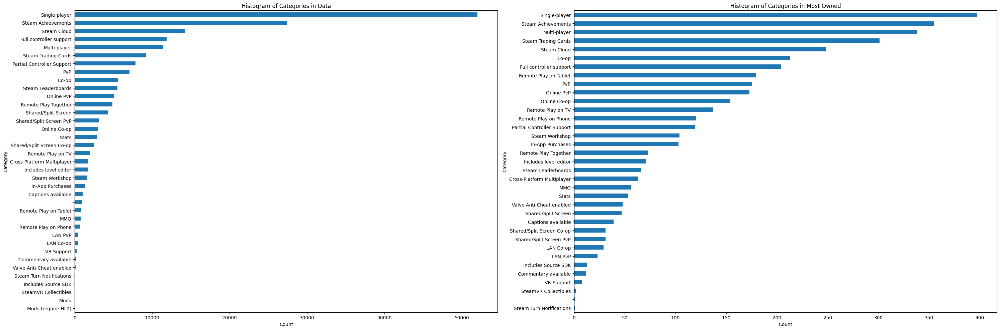

In [0]:
data_category_counts_pd = data_category_counts.toPandas()
most_owned_category_counts_pd = most_owned_category_counts.toPandas()

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(30, 10))

data_category_counts_pd.plot(kind='barh', x='category', y='count', ax=axes[0], legend=False)
axes[0].set_title('Histogram of Categories in Data')
axes[0].set_xlabel('Count')
axes[0].set_ylabel('Category')

most_owned_category_counts_pd.plot(kind='barh', x='category', y='count', ax=axes[1], legend=False)
axes[1].set_title('Histogram of Categories in Most Owned')
axes[1].set_xlabel('Count')
axes[1].set_ylabel('Category')

plt.tight_layout()
plt.show()

### Parmi les catégories même si l'ordre ne change pas entre l'ensemble des jeux et les jeux les plus populaires on voit que l'importance du nombre de single-player diminue chez les jeux les plus populaires au profit d'autres catégories comme PvP/Online PvP par exemple

In [0]:
tags = data.select("id", "tags.*")
most_owned_tags = most_owned.select("id", "tags.*")
display(tags)
display(most_owned_tags)

id,1980s,1990's,2.5D,2D,2D Fighter,2D Platformer,360 Video,3D,3D Fighter,3D Platformer,3D Vision,4 Player Local,4X,6DOF,8-bit Music,ATV,Abstract,Action,Action RPG,Action RTS,Action Roguelike,Action-Adventure,Addictive,Adventure,Agriculture,Aliens,Alternate History,Ambient,America,Animation & Modeling,Anime,Arcade,Archery,Arena Shooter,Artificial Intelligence,Assassin,Asymmetric VR,Asynchronous Multiplayer,Atmospheric,Audio Production,Auto Battler,Automation,Automobile Sim,BMX,Base-Building,Baseball,Based On A Novel,Basketball,Battle Royale,Beat 'em up,Beautiful,Benchmark,Bikes,Blood,Board Game,Boss Rush,Bowling,Boxing,Building,Bullet Hell,Bullet Time,CRPG,Capitalism,Card Battler,Card Game,Cartoon,Cartoony,Casual,Cats,Character Action Game,Character Customization,Chess,Choices Matter,Choose Your Own Adventure,Cinematic,City Builder,Class-Based,Classic,Clicker,Co-op,Co-op Campaign,Coding,Cold War,Collectathon,Colony Sim,Colorful,Combat,Combat Racing,Comedy,Comic Book,Competitive,Conspiracy,Controller,Conversation,Cooking,Cozy,Crafting,Creature Collector,Cricket,Crime,Crowdfunded,Cult Classic,Cute,Cyberpunk,Cycling,Dark,Dark Comedy,Dark Fantasy,Dark Humor,Dating Sim,Deckbuilding,Demons,Design & Illustration,Destruction,Detective,Difficult,Dinosaurs,Diplomacy,Documentary,Dog,Dragons,Drama,Driving,Dungeon Crawler,Dungeons & Dragons,Dynamic Narration,Dystopian,Early Access,Economy,Education,Electronic,Electronic Music,Emotional,Epic,Episodic,Escape Room,Experience,Experimental,Exploration,FMV,FPS,Faith,Family Friendly,Fantasy,Farming,Farming Sim,Fast-Paced,Feature Film,Female Protagonist,Fighting,First-Person,Fishing,Flight,Football,Foreign,Free to Play,Funny,Futuristic,Gambling,Game Development,GameMaker,Games Workshop,Gaming,God Game,Golf,Gore,Gothic,Grand Strategy,Great Soundtrack,Grid-Based Movement,Gun Customization,Hack and Slash,Hacking,Hand-drawn,Hardware,Heist,Hentai,Hero Shooter,Hex Grid,Hidden Object,Historical,Hockey,Horror,Horses,Hunting,Idler,Illuminati,Immersive,Immersive Sim,Indie,Instrumental Music,Intentionally Awkward Controls,Interactive Fiction,Inventory Management,Investigation,Isometric,JRPG,Jet,Job Simulator,Jump Scare,Kickstarter,LEGO,LGBTQ+,Lemmings,Level Editor,Life Sim,Linear,Local Co-Op,Local Multiplayer,Logic,Loot,Looter Shooter,Lore-Rich,Lovecraftian,MMORPG,MOBA,Magic,Mahjong,Management,Mars,Martial Arts,Massively Multiplayer,Masterpiece,Match 3,Mature,Mechs,Medical Sim,Medieval,Memes,Metroidvania,Military,Mini Golf,Minigames,Minimalist,Mining,Mod,Moddable,Modern,Motocross,Motorbike,Mouse only,Movie,Multiplayer,Multiple Endings,Music,Music-Based Procedural Generation,Musou,Mystery,Mystery Dungeon,Mythology,NSFW,Narration,Narrative,Nature,Naval,Naval Combat,Ninja,Noir,Nonlinear,Nostalgia,Nudity,Offroad,Old School,On-Rails Shooter,Online Co-Op,Open World,Open World Survival Craft,Otome,Outbreak Sim,Parkour,Parody,Party,Party Game,Party-Based RPG,Perma Death,Philosophical,Photo Editing,Physics,Pinball,Pirates,Pixel Graphics,Platformer,Point & Click,Political,Political Sim,Politics,Pool,Post-apocalyptic,Precision Platformer,Procedural Generation,Programming,Psychedelic,Psychological,Psychological Horror,Puzzle,Puzzle-Platformer,PvE,PvP,Quick-Time Events,RPG,RPGMaker,RTS,Racing,Real Time Tactics,Real-Time,Real-Time with Pause,Realistic,Reboot,Relaxing,Remake,Replay Value,Resource Management,Retro,Rhythm,Robots,Rock Music,Rogue-like,Rogue-lite,Roguelike Deckbuilder,Roguevania,Romance,Rome,Rugby,Runner,Sailing,Sandbox,Satire,Sci-fi,Science,Score Attack,Sequel,Sexual Content,Shoot 'Em Up,Shooter,Shop Keeper,Short,Side Scroller,Silent Protagonist,Simulation,Singleplayer,Skateboarding,Skating,Skiing,Sniper,Snooker,Snow,Snowboarding,Soccer,Social Deduction,Software,Software Training,Sokoban,Solitaire,Souls-like,Soundtrack,Space,Space Sim,Spaceships,Spectacle fighter,Spelling,Split Screen,Sports,Stealth,Steam Machine,Steampunk,Story Rich,Strategy,Strategy RPG,Stylized,Submarine,Superhero,Supernatural,Surreal,Survi

id,1980s,1990's,2.5D,2D,2D Fighter,2D Platformer,360 Video,3D,3D Fighter,3D Platformer,3D Vision,4 Player Local,4X,6DOF,8-bit Music,ATV,Abstract,Action,Action RPG,Action RTS,Action Roguelike,Action-Adventure,Addictive,Adventure,Agriculture,Aliens,Alternate History,Ambient,America,Animation & Modeling,Anime,Arcade,Archery,Arena Shooter,Artificial Intelligence,Assassin,Asymmetric VR,Asynchronous Multiplayer,Atmospheric,Audio Production,Auto Battler,Automation,Automobile Sim,BMX,Base-Building,Baseball,Based On A Novel,Basketball,Battle Royale,Beat 'em up,Beautiful,Benchmark,Bikes,Blood,Board Game,Boss Rush,Bowling,Boxing,Building,Bullet Hell,Bullet Time,CRPG,Capitalism,Card Battler,Card Game,Cartoon,Cartoony,Casual,Cats,Character Action Game,Character Customization,Chess,Choices Matter,Choose Your Own Adventure,Cinematic,City Builder,Class-Based,Classic,Clicker,Co-op,Co-op Campaign,Coding,Cold War,Collectathon,Colony Sim,Colorful,Combat,Combat Racing,Comedy,Comic Book,Competitive,Conspiracy,Controller,Conversation,Cooking,Cozy,Crafting,Creature Collector,Cricket,Crime,Crowdfunded,Cult Classic,Cute,Cyberpunk,Cycling,Dark,Dark Comedy,Dark Fantasy,Dark Humor,Dating Sim,Deckbuilding,Demons,Design & Illustration,Destruction,Detective,Difficult,Dinosaurs,Diplomacy,Documentary,Dog,Dragons,Drama,Driving,Dungeon Crawler,Dungeons & Dragons,Dynamic Narration,Dystopian,Early Access,Economy,Education,Electronic,Electronic Music,Emotional,Epic,Episodic,Escape Room,Experience,Experimental,Exploration,FMV,FPS,Faith,Family Friendly,Fantasy,Farming,Farming Sim,Fast-Paced,Feature Film,Female Protagonist,Fighting,First-Person,Fishing,Flight,Football,Foreign,Free to Play,Funny,Futuristic,Gambling,Game Development,GameMaker,Games Workshop,Gaming,God Game,Golf,Gore,Gothic,Grand Strategy,Great Soundtrack,Grid-Based Movement,Gun Customization,Hack and Slash,Hacking,Hand-drawn,Hardware,Heist,Hentai,Hero Shooter,Hex Grid,Hidden Object,Historical,Hockey,Horror,Horses,Hunting,Idler,Illuminati,Immersive,Immersive Sim,Indie,Instrumental Music,Intentionally Awkward Controls,Interactive Fiction,Inventory Management,Investigation,Isometric,JRPG,Jet,Job Simulator,Jump Scare,Kickstarter,LEGO,LGBTQ+,Lemmings,Level Editor,Life Sim,Linear,Local Co-Op,Local Multiplayer,Logic,Loot,Looter Shooter,Lore-Rich,Lovecraftian,MMORPG,MOBA,Magic,Mahjong,Management,Mars,Martial Arts,Massively Multiplayer,Masterpiece,Match 3,Mature,Mechs,Medical Sim,Medieval,Memes,Metroidvania,Military,Mini Golf,Minigames,Minimalist,Mining,Mod,Moddable,Modern,Motocross,Motorbike,Mouse only,Movie,Multiplayer,Multiple Endings,Music,Music-Based Procedural Generation,Musou,Mystery,Mystery Dungeon,Mythology,NSFW,Narration,Narrative,Nature,Naval,Naval Combat,Ninja,Noir,Nonlinear,Nostalgia,Nudity,Offroad,Old School,On-Rails Shooter,Online Co-Op,Open World,Open World Survival Craft,Otome,Outbreak Sim,Parkour,Parody,Party,Party Game,Party-Based RPG,Perma Death,Philosophical,Photo Editing,Physics,Pinball,Pirates,Pixel Graphics,Platformer,Point & Click,Political,Political Sim,Politics,Pool,Post-apocalyptic,Precision Platformer,Procedural Generation,Programming,Psychedelic,Psychological,Psychological Horror,Puzzle,Puzzle-Platformer,PvE,PvP,Quick-Time Events,RPG,RPGMaker,RTS,Racing,Real Time Tactics,Real-Time,Real-Time with Pause,Realistic,Reboot,Relaxing,Remake,Replay Value,Resource Management,Retro,Rhythm,Robots,Rock Music,Rogue-like,Rogue-lite,Roguelike Deckbuilder,Roguevania,Romance,Rome,Rugby,Runner,Sailing,Sandbox,Satire,Sci-fi,Science,Score Attack,Sequel,Sexual Content,Shoot 'Em Up,Shooter,Shop Keeper,Short,Side Scroller,Silent Protagonist,Simulation,Singleplayer,Skateboarding,Skating,Skiing,Sniper,Snooker,Snow,Snowboarding,Soccer,Social Deduction,Software,Software Training,Sokoban,Solitaire,Souls-like,Soundtrack,Space,Space Sim,Spaceships,Spectacle fighter,Spelling,Split Screen,Sports,Stealth,Steam Machine,Steampunk,Story Rich,Strategy,Strategy RPG,Stylized,Submarine,Superhero,Supernatural,Surreal,Survi

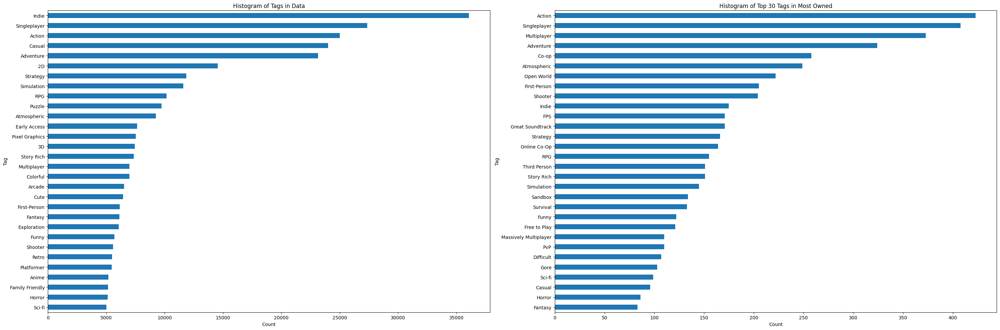

In [0]:
tags_non_null_counts = tags.drop('id').drop('id').select(
    [(tags[f"`{col}`"].isNotNull()).cast('int').alias(col) for col in tags.columns if col != 'id']
).agg(
    *[(spark_sum(f"`{col}`").alias(col)) for col in tags.columns if col != 'id']
).toPandas().T.reset_index()
tags_non_null_counts.columns = ['tag', 'count']

most_owned_tags_non_null_counts = most_owned_tags.drop('id').select(
    [(most_owned_tags[f"`{col}`"].isNotNull()).cast('int').alias(col) for col in most_owned_tags.columns if col != 'id']
).agg(
    *[(spark_sum(f"`{col}`").alias(col)) for col in most_owned_tags.columns if col != 'id']
).toPandas().T.reset_index()
most_owned_tags_non_null_counts.columns = ['tag', 'count']

most_owned_tags_top_30 = most_owned_tags_non_null_counts.nlargest(30, 'count').sort_values(by='count', ascending=False)
tags_top_30 = tags_non_null_counts.nlargest(30, 'count').sort_values(by='count', ascending=False)
most_owned_tags_top_30 = most_owned_tags_top_30.iloc[::-1]
tags_top_30 = tags_top_30.iloc[::-1]

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(30, 10))

tags_top_30 .plot(kind='barh', x='tag', y='count', ax=axes[0], legend=False)
axes[0].set_title('Histogram of Tags in Data')
axes[0].set_xlabel('Count')
axes[0].set_ylabel('Tag')

most_owned_tags_top_30.plot(kind='barh', x='tag', y='count', ax=axes[1], legend=False)
axes[1].set_title('Histogram of Top 30 Tags in Most Owned')
axes[1].set_xlabel('Count')
axes[1].set_ylabel('Tag')

plt.tight_layout()
plt.show()

### Comme noté précédemment le tag indé disparait de la liste des tags les plus présents chez les jeux les plus populaires. Le tag action reste en tête mais on peut voir certains tags (2D) disparaitre ou perdre pas mal de place (stratégie/simulation) au profit de tags comme FPS ou (online) Co-op

In [0]:
action_tags = tags.filter(tags.Action.isNotNull()).drop('Action')
most_owned_action_tags = most_owned_tags.filter(most_owned_tags.Action.isNotNull()).drop('Action')

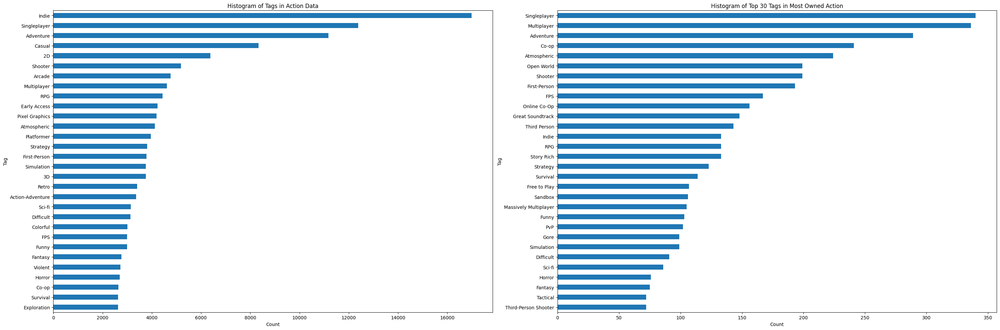

In [0]:
action_tags_non_null_counts = action_tags.drop('id').select(
    [(action_tags[f"`{col}`"].isNotNull()).cast('int').alias(col) for col in action_tags.columns if col != 'id']
).agg(
    *[(spark_sum(f"`{col}`").alias(col)) for col in action_tags.columns if col != 'id']
).toPandas().T.reset_index()
action_tags_non_null_counts.columns = ['tag', 'count']

most_owned_action_tags_non_null_counts = most_owned_action_tags.drop('id').select(
    [(most_owned_action_tags[f"`{col}`"].isNotNull()).cast('int').alias(col) for col in most_owned_action_tags.columns if col != 'id']
).agg(
    *[(spark_sum(f"`{col}`").alias(col)) for col in most_owned_action_tags.columns if col != 'id']
).toPandas().T.reset_index()
most_owned_action_tags_non_null_counts.columns = ['tag', 'count']

most_owned_action_tags_top_30 = most_owned_action_tags_non_null_counts.nlargest(30, 'count').sort_values(by='count', ascending=False)
action_tags_top_30 = action_tags_non_null_counts.nlargest(30, 'count').sort_values(by='count', ascending=False)

most_owned_action_tags_top_30 = most_owned_action_tags_top_30.iloc[::-1]
action_tags_top_30 = action_tags_top_30.iloc[::-1]

fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(30, 10))

action_tags_top_30.plot(kind='barh', x='tag', y='count', ax=axes[0], legend=False)
axes[0].set_title('Histogram of Tags in Action Data')
axes[0].set_xlabel('Count')
axes[0].set_ylabel('Tag')

most_owned_action_tags_top_30.plot(kind='barh', x='tag', y='count', ax=axes[1], legend=False)
axes[1].set_title('Histogram of Top 30 Tags in Most Owned Action')
axes[1].set_xlabel('Count')
axes[1].set_ylabel('Tag')

plt.tight_layout()
plt.show()

### On voit que le tag action est en réalité un tag très générique qui ne dit pas grand chose sur le jeu. Le présence/l'asbene d'autre tags dans les tops tags n'étant pas beaucoup changée par le fait que le jeu soit taggé action par rapport a l'ensemble des jeux. 